In [1]:
!mkdir -p ~/.kaggle
!cp /content/drive/MyDrive/innomatics/kaggle.json ~/.kaggle/

In [2]:
!kaggle datasets download -d vipoooool/new-plant-diseases-dataset

 99% 2.68G/2.70G [00:17<00:00, 260MB/s]
100% 2.70G/2.70G [00:17<00:00, 163MB/s]


In [3]:
import zipfile
zip_ref=zipfile.ZipFile('/content/new-plant-diseases-dataset.zip','r')
zip_ref.extractall('/content/drive/MyDrive/innomatics')
zip_ref.close()

In [2]:
import pathlib
import numpy as np
data_dir = pathlib.Path("/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train")
class_names = np.array(sorted([item.name for item in data_dir.glob("*")]))
print(class_names)

['Apple___Apple_scab' 'Apple___Black_rot' 'Apple___Cedar_apple_rust'
 'Apple___healthy' 'Blueberry___healthy'
 'Cherry_(including_sour)___Powdery_mildew'
 'Cherry_(including_sour)___healthy'
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot'
 'Corn_(maize)___Common_rust_' 'Corn_(maize)___Northern_Leaf_Blight'
 'Corn_(maize)___healthy' 'Grape___Black_rot'
 'Grape___Esca_(Black_Measles)'
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)' 'Grape___healthy'
 'Orange___Haunglongbing_(Citrus_greening)' 'Peach___Bacterial_spot'
 'Peach___healthy' 'Pepper,_bell___Bacterial_spot'
 'Pepper,_bell___healthy' 'Potato___Early_blight' 'Potato___Late_blight'
 'Potato___healthy' 'Raspberry___healthy' 'Soybean___healthy'
 'Squash___Powdery_mildew' 'Strawberry___Leaf_scorch'
 'Strawberry___healthy' 'Tomato___Bacterial_spot' 'Tomato___Early_blight'
 'Tomato___Late_blight' 'Tomato___Leaf_Mold' 'Tomato___Septoria_leaf_spot'
 'Tomato___Spider_mites Two-spotted_spider_mite' 'Tomato___Target_Spot'
 'Tomato___Tom

<ipython-input-20-298863c51c54>:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(7,7))


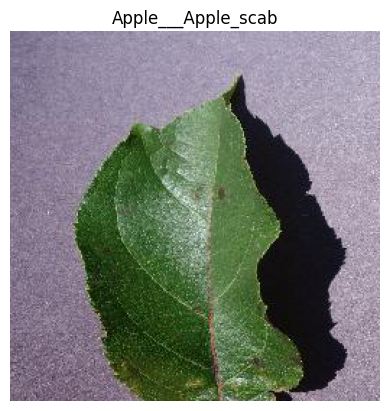

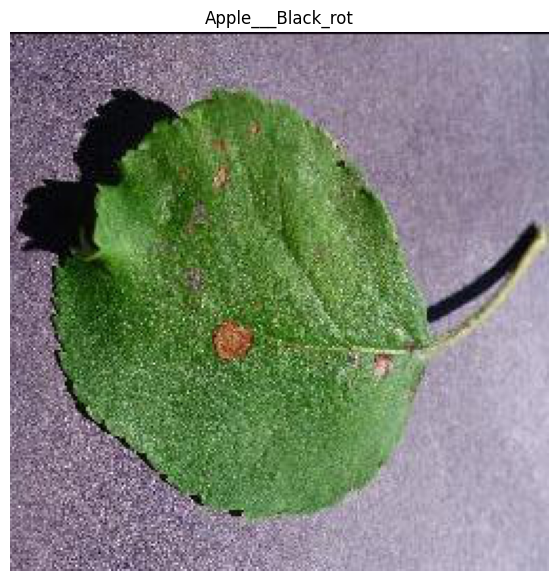

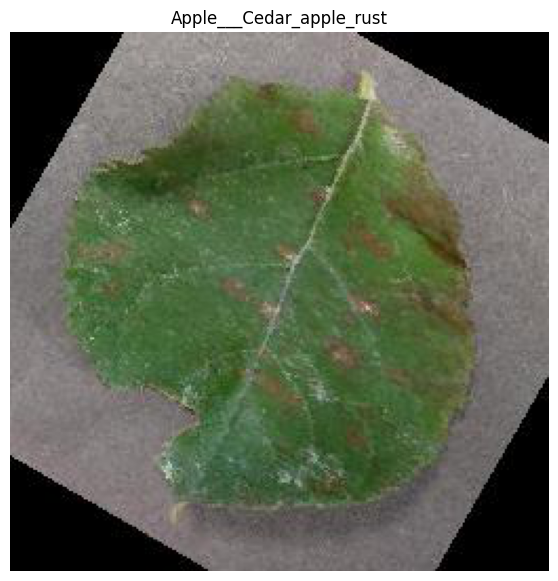

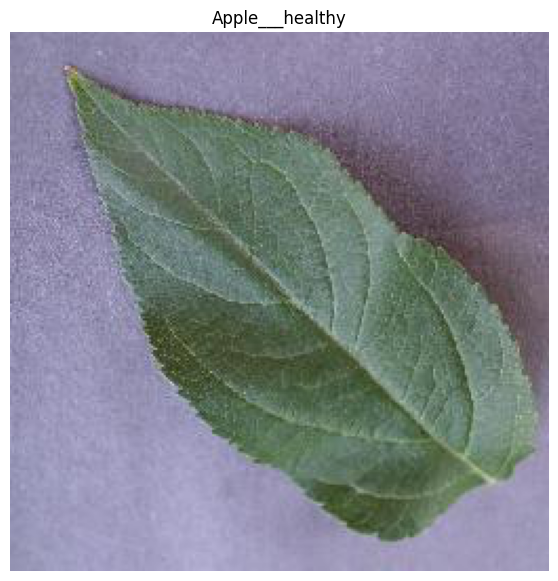

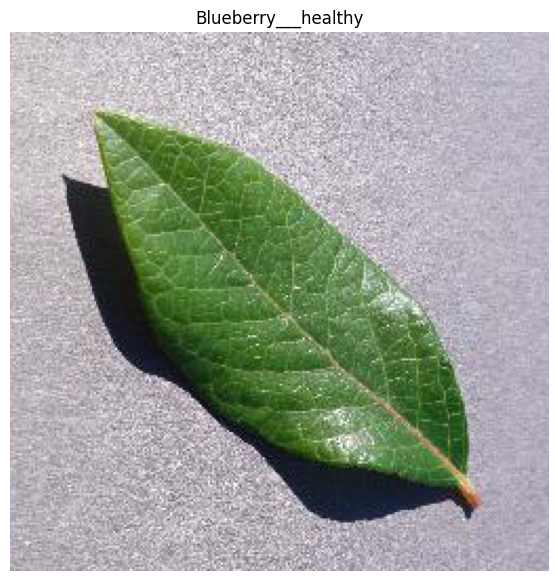

...

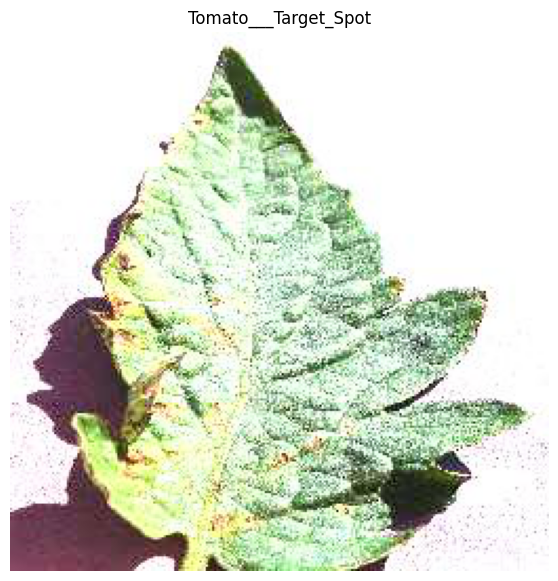

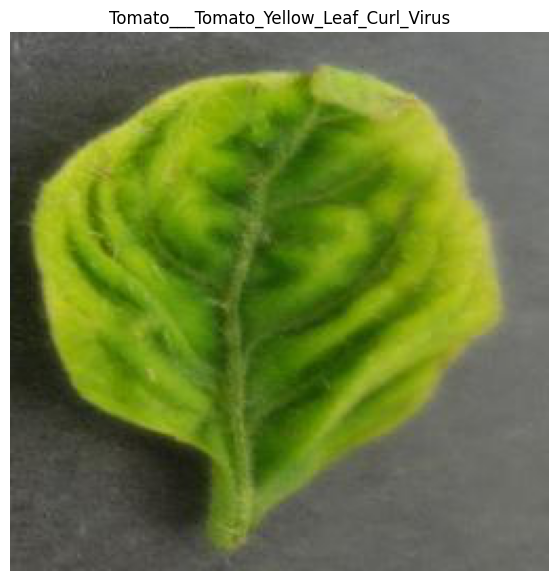

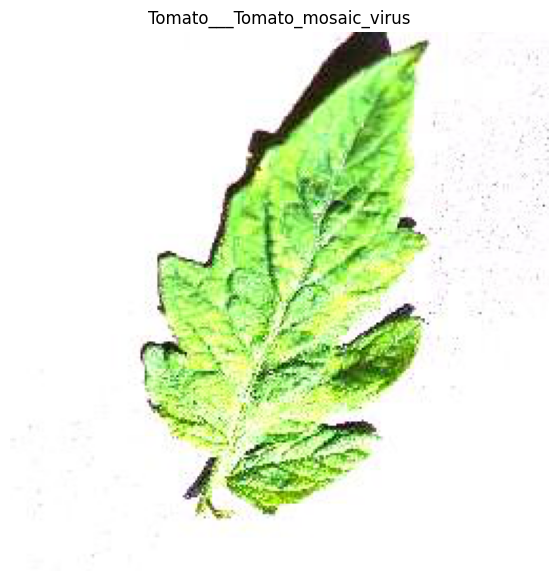

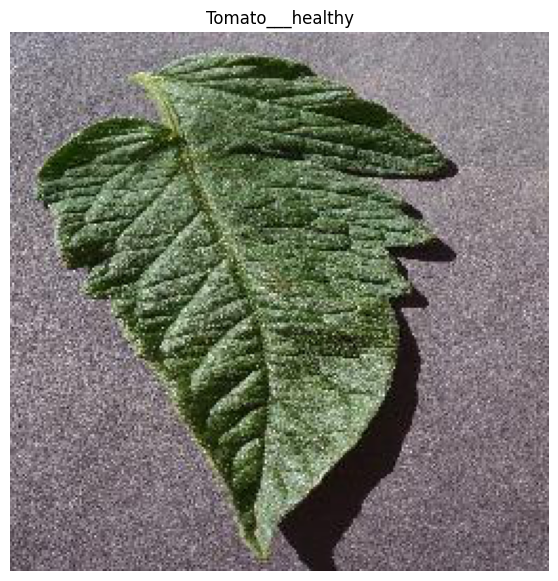

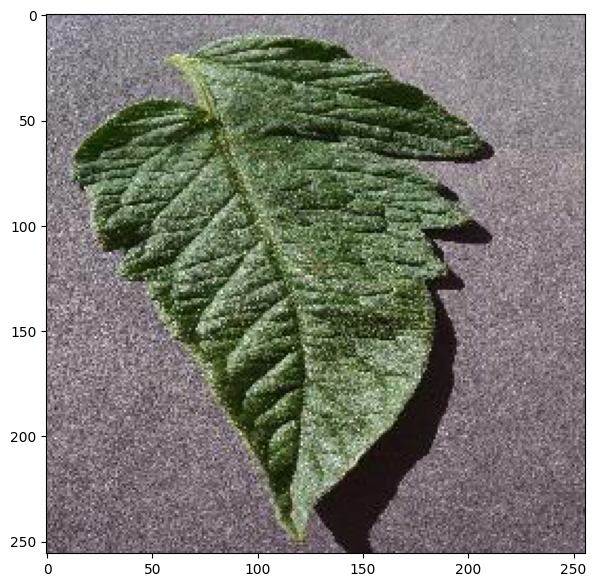

In [20]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import random
def view_random_images(target_dir, target_class):
  target_folder = target_dir + "/" + target_class

  #Get a random image path
  random_image = random.sample(os.listdir(target_folder), 1)
  #print(random_image)
  #Read in the images and plot it using matplot lib
  img = mpimg.imread(target_folder + "/" + random_image[0])
  plt.imshow(img);
  plt.title(target_class)
  plt.axis("off");
  #print(f"Image shape :{img.shape}")
  #print(f"Max values of tensor in images: {img.max()}")
  return img;
for i in class_names:
  path = view_random_images(target_dir="/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train", target_class= i)
  edges = cv2.Canny(path,100,200)
  plt.figure(figsize=(7,7))
  plt.imshow(path)

In [3]:
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from keras import Sequential
from keras.layers import Dense,Conv2D,MaxPooling2D,Flatten,BatchNormalization,Dropout
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model

<ipython-input-22-f3eb271d8cec>:6: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(3, 2, 1),plt.imshow(img)


(-0.5, 255.5, 255.5, -0.5)

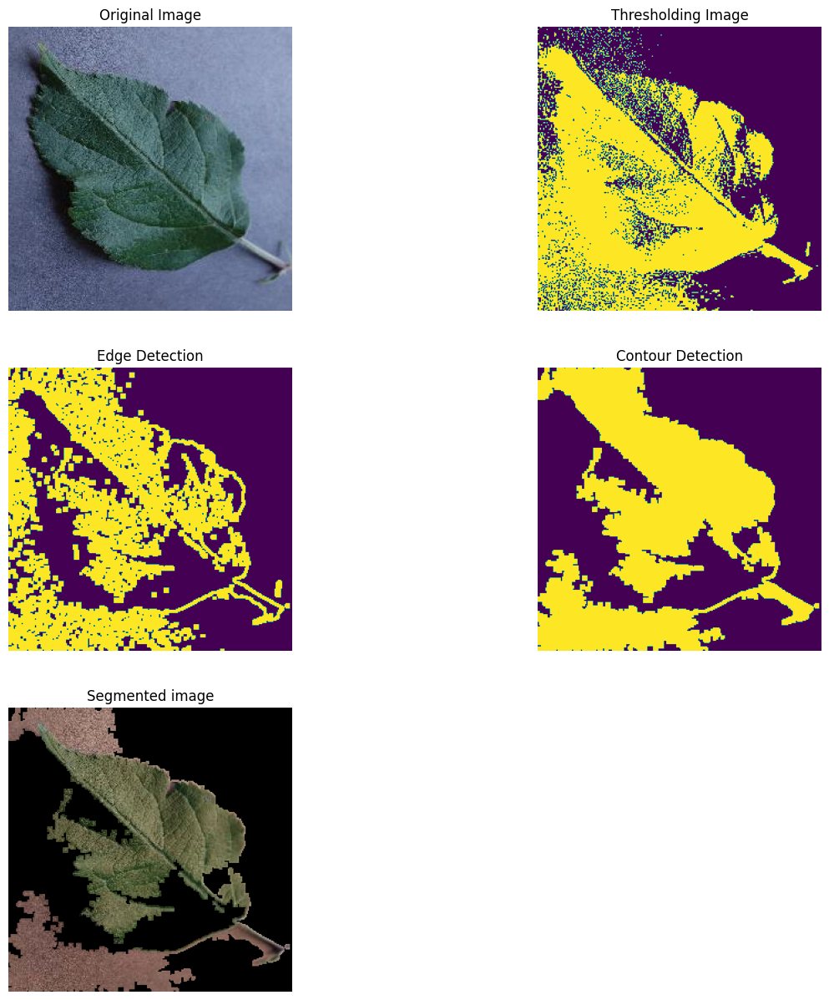

In [22]:
sample_image = cv2.imread('/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid/Apple___healthy/022b515d-41fd-448e-abac-e8722c32d864___RS_HL 8131.JPG')
img = cv2.cvtColor(sample_image,cv2.COLOR_BGR2RGB)
img = cv2.resize(img,(256,256))
plt.figure(figsize=(15,15))
plt.axis('off');
plt.subplot(3, 2, 1),plt.imshow(img)
plt.title('Original Image')

#Image Thresholding

gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
_,thresh = cv2.threshold(gray, np.mean(gray), 255, cv2.THRESH_BINARY_INV)

plt.axis('off')
plt.subplot(3, 2, 2),plt.imshow(thresh)
plt.title('Thresholding Image')

#Edge detection
edges = cv2.dilate(cv2.Canny(thresh,0,255),None)

plt.axis('off')
plt.subplot(3, 2, 3),plt.imshow(edges)
plt.title('Edge Detection')

#Conture Detection
cnt = sorted(cv2.findContours(edges, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)[-2], key=cv2.contourArea)[-1]
mask = np.zeros((256,256), np.uint8)
masked = cv2.drawContours(mask, [cnt],-1, 255, -1)

plt.axis('off')
plt.subplot(3, 2, 4),plt.imshow(masked)
plt.title('Contour Detection')

#Segmentation by regions
dst = cv2.bitwise_and(img, img, mask=mask)
segmented = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)

plt.axis('off')
plt.subplot(3, 2, 5),plt.imshow(segmented)
plt.title('Segmented image')
plt.axis('off')


Text(0.5, 1.0, 'Segmented image')

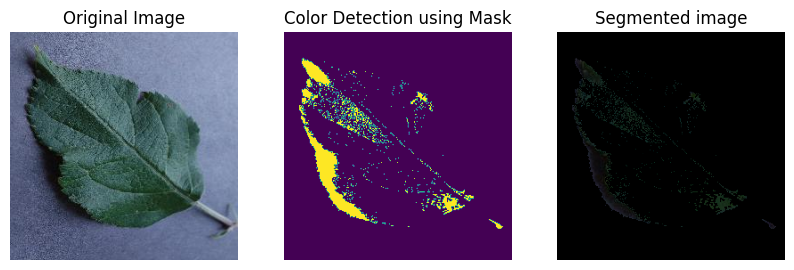

In [23]:
from skimage.filters import threshold_otsu
sample_image = cv2.imread('/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid/Apple___healthy/022b515d-41fd-448e-abac-e8722c32d864___RS_HL 8131.JPG')
img = cv2.cvtColor(sample_image,cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10,10))

plt.subplot(1, 3, 1),plt.axis('off')

plt.imshow(img)
plt.title('Original Image')

#Creating mask by detcting color
low = np.array([0, 0, 0])
high = np.array([215, 51, 51])

mask = cv2.inRange(img, low, high)
plt.subplot(1, 3, 2)
plt.axis('off')

plt.imshow(mask)
plt.title('Color Detection using Mask')
#Apply the Mask
result = cv2.bitwise_and(img, img, mask=mask)
plt.subplot(1, 3, 3)
plt.axis('off')
plt.imshow(result)
plt.title('Segmented image')


In [4]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# make the directories for the train and test

train_dir = "/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train"
valid_dir = "/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid"

# rescalling
train_datagen = ImageDataGenerator(rescale = 1./255,
                                   validation_split = 0.2)

# Importing the data
print("For the training:")
train_data =  train_datagen.flow_from_directory(directory = train_dir,
                                                target_size = (256,256),
                                                batch_size = 32,
                                                class_mode = "categorical",
                                                subset = "training")
print("For the validation:")
# making validation dataset
validation_data = train_datagen.flow_from_directory(directory = valid_dir,
                                                    target_size = (256, 256),
                                                    batch_size = 32,
                                                    class_mode = "categorical",
                                                    subset = "validation")

For the training:
Found 56251 images belonging to 38 classes.
For the validation:
Found 3503 images belonging to 38 classes.


In [5]:
import tensorflow as tf
model=tf.keras.Sequential([
                                tf.keras.layers.Conv2D(10, 3, 1, activation = "relu", input_shape = (256, 256, 3)),
                                tf.keras.layers.MaxPool2D(),
                                tf.keras.layers.Conv2D(10, 3, 1, activation = "relu"),
                                tf.keras.layers.MaxPool2D(),
                                tf.keras.layers.Flatten(),
                                tf.keras.layers.Dense(38, activation = "softmax")
])
model.compile(loss = "categorical_crossentropy",optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

history= model.fit(train_data,epochs = 10,steps_per_epoch = len(train_data),validation_data = validation_data,validation_steps = len(validation_data))

Epoch 1/10
1758/1758 [==============================] - 217s 121ms/step - loss: 1.2516 - accuracy: 0.6441 - val_loss: 0.9746 - val_accuracy: 0.7137
Epoch 2/10
1758/1758 [==============================] - 175s 100ms/step - loss: 0.5706 - accuracy: 0.8264 - val_loss: 0.8218 - val_accuracy: 0.7562
Epoch 3/10
1758/1758 [==============================] - 185s 105ms/step - loss: 0.3415 - accuracy: 0.8922 - val_loss: 0.8552 - val_accuracy: 0.7656
Epoch 4/10
1758/1758 [==============================] - 183s 104ms/step - loss: 0.2027 - accuracy: 0.9361 - val_loss: 0.8549 - val_accuracy: 0.7836
Epoch 5/10
1758/1758 [==============================] - 186s 106ms/step - loss: 0.1295 - accuracy: 0.9597 - val_loss: 1.0607 - val_accuracy: 0.7576
Epoch 6/10
1758/1758 [==============================] - 175s 99ms/step - loss: 0.0947 - accuracy: 0.9709 - val_loss: 1.1420 - val_accuracy: 0.7616
Epoch 7/10
1758/1758 [==============================] - 181s 103ms/step - loss: 0.0786 - accuracy: 0.9756 - val_l

In [6]:
model.save("/content/drive/MyDrive/innomatics/Plant_disease.h5")

In [15]:
import tensorflow as tf

model = tf.keras.models.load_model('/content/drive/MyDrive/innomatics/Plant_disease.h5')

In [16]:
def load_prep_pred_plot(model, filename, class_names = class_names, img_size = 256):
  """Read the image , make shape changes to the images so that it can be read by the model and predict the class and plot the image withg predicted labels
  """
  # Read the images
  img = tf.io.read_file(filename)
  # Decode the image
  img = tf.image.decode_image(img, channels = 3)
  # Resize the image
  img = tf.image.resize(img, [img_size, img_size])
  # rescalling the image
  img = img/255.
  # pred the image and we get prediction_probabilities
  pred = model.predict(tf.expand_dims(img, axis = 0))
  # Make if statefor the multiclass classification
  if len(pred[0]) > 1:
    pred_class = class_names[pred.argmax()] #if more than one output print max one
  else:
    pred_class = class_names[tf.round(pred)] # if only one class we have to rounf towards max and print
  # plot the image
  plt.imshow(img)
  a=pred_class.split('___')
  if a[1]=='healthy':
    plt.title(f"Prediction:\n leave name:{a[0]} \n leave is : {a[1]}")
  else:
    b=a[1].split('_')
    b=' '.join(b)
    plt.title(f"Prediction:\n leave name:{a[0]} \n leave is : unhealthy \n disease name : {b}")

  plt.axis(False)

1/1 [==============================] - 0s 158ms/step


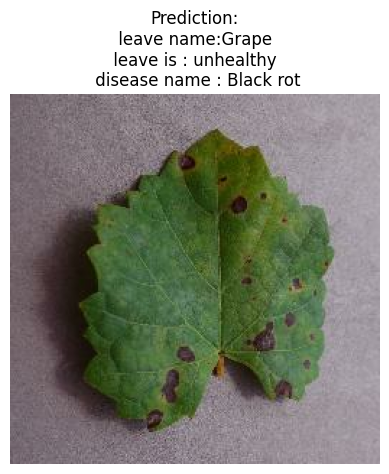

In [19]:
load_prep_pred_plot(model, "/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid/Grape___Black_rot/00090b0f-c140-4e77-8d20-d39f67b75fcc___FAM_B.Rot 0376.JPG")